In [1]:
import warnings

warnings.filterwarnings("ignore", category=UserWarning)
warnings.filterwarnings("ignore", category=FutureWarning)

In [2]:
import os

# import matplotlib.pyplot as plt
# import numpy as np
# import scanpy as sc
# import seaborn as sns

In [3]:
import datetime

date_var = datetime.datetime.now().strftime("%Y%m%d")

In [4]:
import spatialdata as sd

In [5]:
from pathlib import Path

In [6]:
base_path = Path("/dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark")

In [7]:
data_dir = os.path.abspath(base_path)
!ls -l $data_dir

total 82
drwxrws---  8 ra98gaq nogroup 8192 Aug  4 01:03 analysis
drwxrws---  4 nobody  nogroup 4096 Aug  5 14:49 metrics
drwxrws--- 12 ra98gaq nogroup 4096 Sep 12 14:35 misc
-rw-r--r--  1 ra98gaq nogroup 4483 Jun 26 13:35 sample_paths.json
drwxrws--- 50 ra98gaq nogroup 8192 Sep 16 15:56 samples
drwxrws--- 10 ra98gaq nogroup 4096 Apr 17 14:20 temp


In [8]:
sample_name = "foxf2_s2_r1"

# Functions

In [34]:
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.colors import LinearSegmentedColormap

# Black to blue
colors_dapi = [(0, 0, 0), (0, 0, 1)]
blue_cmap = LinearSegmentedColormap.from_list("custom_blue", colors_dapi)

In [35]:
# White to Blue
# colors_dapi = [(1, 1, 1), (0, 0, 1)]
# blue_cmap = LinearSegmentedColormap.from_list("white_to_blue", colors_dapi)
# requires black borders!

In [36]:
def visualize_spatial_data(
    sdata_sub,
    bounds,
    cell_types_mouse_brain,
    colors,
    dotsize,
    data_dir,
    sample_name,
    date_var,
    vname,
    cmap=blue_cmap,
    show_in_notebook=True,
):
    """
    Visualize spatial data with cell markers on DAPI background.
    Order:
      1) DAPI only
      2) DAPI + transcripts (no boundaries)
      3) DAPI + boundaries + transcripts (one per boundary)
    Saves to disk (if savefig lines are uncommented) and optionally displays in notebook.
    """
    output_dir = os.path.join(data_dir, "samples", sample_name, "plots")
    os.makedirs(output_dir, exist_ok=True)

    style_settings = {
        "axes.spines.top": False,
        "axes.spines.right": False,
        "axes.spines.bottom": False,
        "axes.spines.left": False,
        "xtick.bottom": False,
        "xtick.labelbottom": False,
        "ytick.left": False,
        "ytick.labelleft": False,
    }

    with plt.style.context("dark_background"), mpl.rc_context(style_settings):
        # --- (1) DAPI only ---
        plot = sdata_sub.pl.render_images(
            element="foxf2_s2_r1_z3", channel="DAPI", cmap=cmap
        )
        plot.pl.show(figsize=(18, 10), coordinate_systems="pixel")
        # plt.savefig(
        #     os.path.join(output_dir, f"{date_var}_{vname}_DAPI_only.png"),
        #     dpi=500,
        #     bbox_inches="tight",
        #     pad_inches=0.2,
        #     transparent=False,
        # )
        if not show_in_notebook:
            plt.close()

        # --- (2) DAPI + transcripts (no boundaries) ---
        plot = sdata_sub.pl.render_images(
            element="foxf2_s2_r1_z3", channel="DAPI", cmap=cmap
        )
        for cell_type, markers in cell_types_mouse_brain.items():
            for marker in markers:
                plot = plot.pl.render_points(
                    "foxf2_s2_r1_transcripts",
                    color="gene",
                    groups=marker,
                    palette=colors[cell_type],
                    size=dotsize,
                )
        plot.pl.show(figsize=(18, 10), coordinate_systems="pixel")
        # plt.savefig(
        #     os.path.join(output_dir, f"{date_var}_{vname}_DAPI_points.png"),
        #     dpi=500,
        #     bbox_inches="tight",
        #     pad_inches=0.2,
        #     transparent=False,
        # )
        if not show_in_notebook:
            plt.close()

        # --- (3) DAPI + boundaries + transcripts (one per boundary) ---
        for bound in bounds:
            plot = sdata_sub.pl.render_images(
                element="foxf2_s2_r1_z3", channel="DAPI", cmap=cmap
            ).pl.render_shapes(
                element=bound,
                outline_width=1.5,
                outline_alpha=1,
                outline_color="white",
                color="white",
                fill_alpha=0.05,
            )

            # Add markers for each cell type
            # for cell_type, markers in cell_types_mouse_brain.items():
            #    for marker in markers:
            #        plot = plot.pl.render_points(
            #            "foxf2_s2_r1_transcripts",
            #            color="gene",
            #            groups=marker,
            #            palette=colors[cell_type],
            #            size=dotsize,
            #        )
            #
            plot.pl.show(figsize=(18, 10), coordinate_systems="pixel")
            # boundary_name = bound.split("boundaries_")[1]
            # plt.savefig(
            #     os.path.join(output_dir, f"{date_var}_{vname}_{boundary_name}.png"),
            #     dpi=500,
            #     bbox_inches="tight",
            #     pad_inches=0.2,
            #     transparent=False,
            # )
            if not show_in_notebook:
                plt.close()

In [11]:
cell_types_mouse_brain = {
    "ECs": ["Cldn5", "Cdh5", "Pecam1", "Kdr", "Nos3"],
    "Pericytes": ["Vtn", "Kcnj8", "Rgs5", "Atp13a5", "Anpep"],
    "SMCs": ["Acta2", "Pdlim3", "Tagln", "Myh11", "Adamts1"],
    "VLMCs": ["Dcn", "Col1a1", "Lama1", "Slc7a11", "Slc6a13"],
}
# colors = {
#    "ECs": "#7CEC37",
#    "Pericytes": "#FDF778",
#    "SMCs": "#FF6464",
#    "Fibroblasts": "#43BCE7"
# }
colors = {
    "ECs": "#FF6464",
    "Pericytes": "#FFE62E",
    "SMCs": "#29FBA7",
    "VLMCs": "#85B0F9",
}

In [12]:
cell_types_mouse_brain_all = {
    "ECs": ["Cldn5", "Cdh5", "Pecam1", "Kdr", "Nos3"],
    "Pericytes": ["Vtn", "Kcnj8", "Rgs5", "Atp13a5", "Anpep"],
    "SMCs": ["Acta2", "Pdlim3", "Tagln", "Myh11", "Adamts1"],
    "VLMCs": ["Dcn", "Col1a1", "Lama1", "Slc7a11", "Slc6a13"],
    "Astrocytes": ["Aqp4", "Slc1a3", "Plpp3", "Clu", "Apoe"],
    "Choroid Plexus": ["Foxj1", "Pifo", "Tmem212", "Ccdc153"],
    "Oligodendrocytes": ["Apod", "Mag", "Enpp2", "Cnp", "Cldn11"],
    "OPCs": ["Olig2", "Cspg5", "Ptprz1", "Pdgfra", "Sox10"],
    "Microglia/Macrophages": ["Aif1", "C1qa", "C1qc", "Itgax", "Ctss"],
    "Neurons": ["Rbfox3", "Meg3", "Gad1", "Slc32a1", "Slc17a7"],
    #'':['','','','',''],
    #'':['','','','','']
}
colors_all = {
    "ECs": "#FF6464",
    "Pericytes": "#FFE62E",
    "SMCs": "#29FBA7",
    "VLMCs": "#85B0F9",
    "Astrocytes": "#FE9A30",
    "Choroid Plexus": "#D2C800",
    "Oligodendrocytes": "#4564FF",
    "OPCs": "#2024FF",
    "Microglia/Macrophages": "#21EFA5",
    "Neurons": "#CEB3FF",
}

# Load sdata

In [13]:
sdata_path = os.path.join(data_dir, "samples", sample_name, "sdata_z3.zarr")
if "sdata" not in locals():
    sdata = sd.read_zarr(sdata_path)

In [14]:
sdata

SpatialData object, with associated Zarr store: /dss/dssfs03/pn52re/pn52re-dss-0001/cellseg-benchmark/samples/foxf2_s2_r1/sdata_z3.zarr
├── Images
│     └── 'foxf2_s2_r1_z3': DataTree[cyx] (8, 54456, 65675), (8, 27228, 32837), (8, 13614, 16418), (8, 6807, 8209), (8, 3403, 4104)
├── Points
│     └── 'foxf2_s2_r1_transcripts': DataFrame with shape: (<Delayed>, 9) (2D points)
├── Shapes
│     ├── 'boundaries_Baysor_2D_Cellpose_1_DAPI_PolyT_0.2': GeoDataFrame shape: (181678, 1) (2D shapes)
│     ├── 'boundaries_Baysor_2D_Cellpose_1_DAPI_PolyT_0.8': GeoDataFrame shape: (164856, 1) (2D shapes)
│     ├── 'boundaries_Baysor_2D_Cellpose_1_DAPI_Transcripts_0.2': GeoDataFrame shape: (174569, 1) (2D shapes)
│     ├── 'boundaries_Baysor_2D_Cellpose_1_DAPI_Transcripts_0.8': GeoDataFrame shape: (151323, 1) (2D shapes)
│     ├── 'boundaries_Baysor_2D_Cellpose_1_nuclei_model_1.0': GeoDataFrame shape: (180656, 1) (2D shapes)
│     ├── 'boundaries_Baysor_2D_Cellpose_2_DAPI_PolyT_0.2': GeoDataFrame shape:

In [15]:
# optional: add ficture factors

In [16]:
# ficture_sdata_file = os.path.join(
#    data_dir, "samples", sample_name, "results", "Ficture", "sdata.zarr"
# )
# ficture_sdata = sd.read_zarr(ficture_sdata_file)

In [17]:
# factor = "nF21"

In [18]:
# cropped_sdata.pl.render_points(
#    f"{sample_name}_all_transcript_factors",
#    color=f"{factor}_factors",
#    cmap=cmap,
#    method="matplotlib",
#    alpha=0.5,
#    size=0.1,
# )

# Plot

In [19]:
bound_keys = list(sdata.shapes.keys())
bound_keys

['boundaries_Baysor_2D_Cellpose_1_DAPI_PolyT_0.2',
 'boundaries_Baysor_2D_Cellpose_1_DAPI_PolyT_0.8',
 'boundaries_Baysor_2D_Cellpose_1_DAPI_Transcripts_0.2',
 'boundaries_Baysor_2D_Cellpose_1_DAPI_Transcripts_0.8',
 'boundaries_Baysor_2D_Cellpose_1_nuclei_model_1.0',
 'boundaries_Baysor_2D_Cellpose_2_DAPI_PolyT_0.2',
 'boundaries_Baysor_2D_Cellpose_2_DAPI_PolyT_0.8',
 'boundaries_Baysor_2D_Cellpose_2_DAPI_Transcripts_0.2',
 'boundaries_Baysor_2D_Cellpose_2_DAPI_Transcripts_0.8',
 'boundaries_Baysor_3D',
 'boundaries_Cellpose_1_DAPI_PolyT',
 'boundaries_Cellpose_1_DAPI_Transcripts',
 'boundaries_Cellpose_1_Merlin',
 'boundaries_Cellpose_1_nuclei_model',
 'boundaries_Cellpose_2_DAPI_PolyT',
 'boundaries_Cellpose_2_DAPI_Transcripts',
 'boundaries_ComSeg',
 'boundaries_Negative_Control_Rastered_10',
 'boundaries_Negative_Control_Rastered_25',
 'boundaries_Negative_Control_Rastered_5',
 'boundaries_Negative_Control_Voronoi',
 'boundaries_Proseg_Cellpose_1_DAPI_PolyT',
 'boundaries_Proseg_C

# TBC HERE

In [20]:
bounds = [
    "boundaries_Baysor_2D_Cellpose_2_DAPI_Transcripts_0.2",
    "boundaries_Proseg_Cellpose_1_nuclei_model",
    "boundaries_Cellpose_1_DAPI_PolyT",
    "boundaries_Cellpose_2_DAPI_PolyT",
    "boundaries_ComSeg",
    "boundaries_Negative_Control_Voronoi",
]

In [21]:
# bounds = [
#    "boundaries_Baysor_2D_nucleus_100",
#    "boundaries_Cellpose_1_DAPI_PolyT",
#    "boundaries_Cellpose_2_DAPI_PolyT",
#    "boundaries_ComSeg",
# ]

INFO     Using 'datashader' backend with 'None' as reduction method to speed up plotting. Depending on the         
         reduction method, the value range of the plot might change. Set method to 'matplotlib' do disable this    
         behaviour.                                                                                                


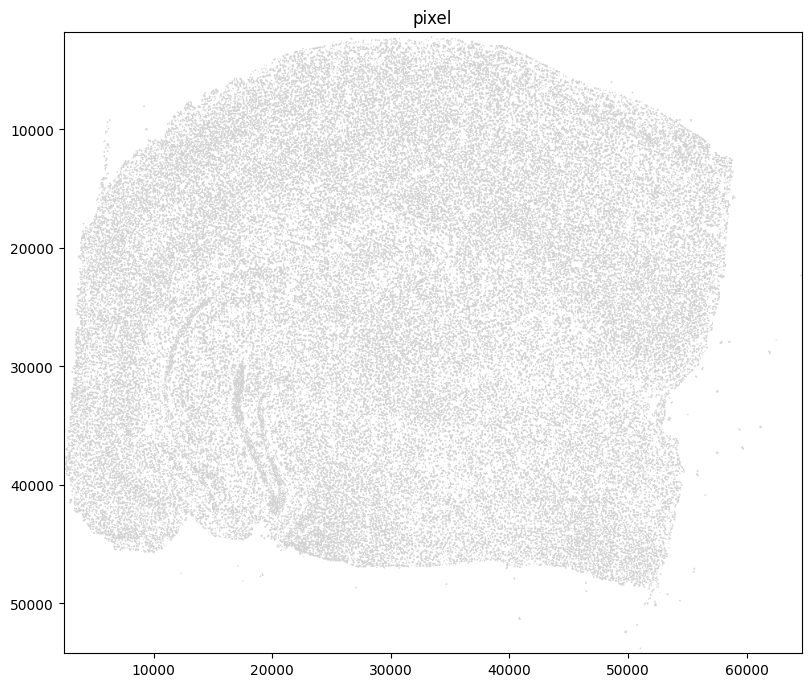

In [22]:
# sdata.pl.render_points("foxf2_s2_r1_transcripts", groups = "Cdh5").pl.show(figsize=(8, 8))
sdata.pl.render_shapes(element=bounds[2]).pl.show(
    figsize=(8, 8), coordinate_systems="pixel"
)

In [23]:
# lepto1
# pixel scale
vname = "pial_artery"
dotsize = 1
bb_xmin = 52800
bb_ymin = 35800
bb_w = 4300
bb_h = 1200
bb_xmax = bb_xmin + bb_w
bb_ymax = bb_ymin + bb_h

In [24]:
sdata_sub = sdata.query.bounding_box(
    axes=["x", "y"],
    min_coordinate=[bb_xmin, bb_ymin],
    max_coordinate=[bb_xmax, bb_ymax],
    target_coordinate_system="pixel",
)

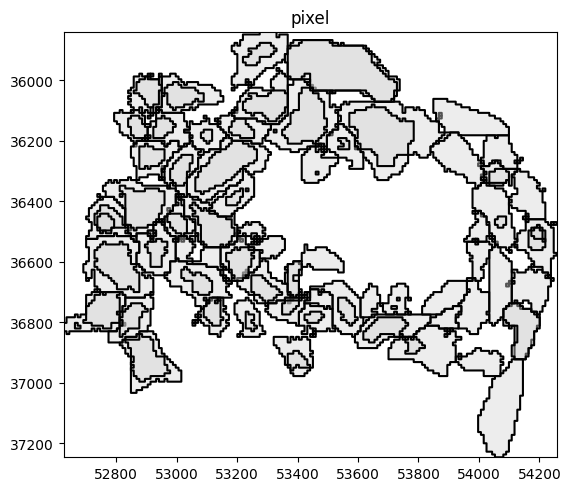

In [25]:
sdata_sub.pl.render_shapes(
    element=bounds[1],
    outline_alpha=1.0,
    fill_alpha=0.4,
).pl.show(coordinate_systems="pixel")

INFO     Rasterizing image for faster rendering.                                                                   
INFO     Rasterizing image for faster rendering.                                                                   
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will b

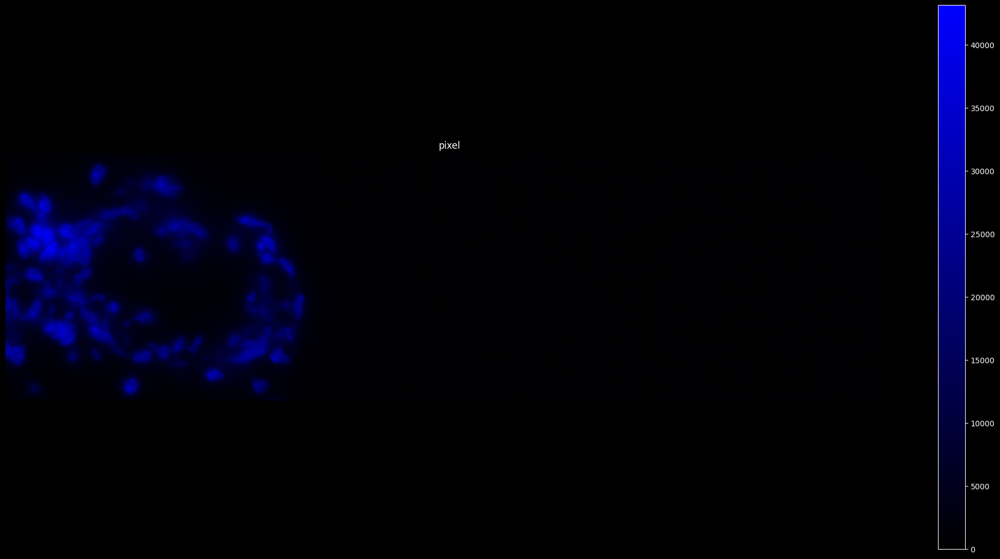

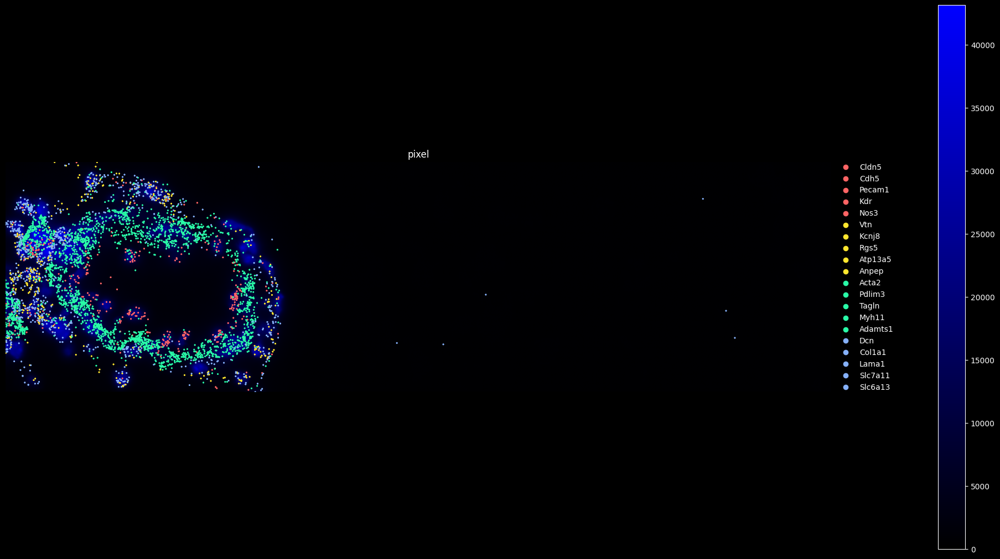

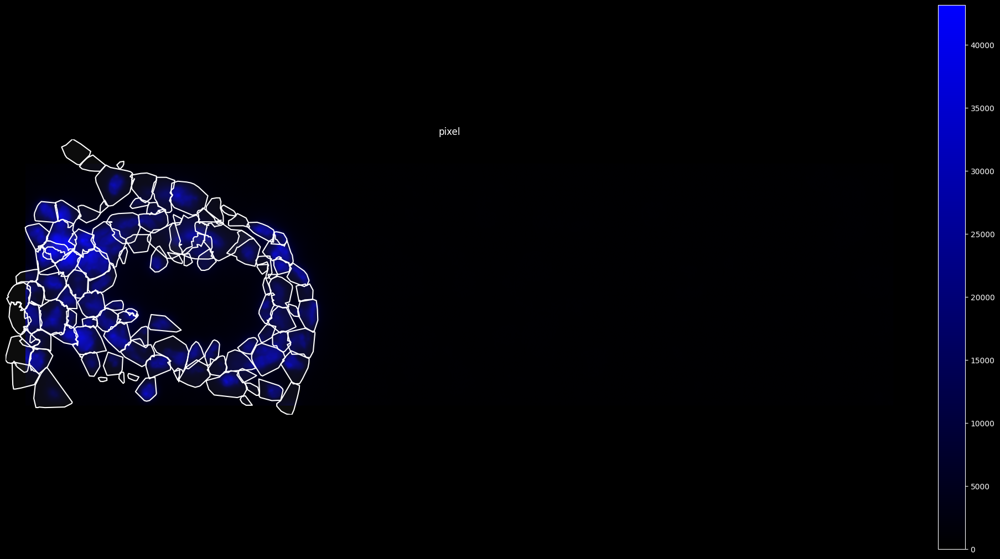

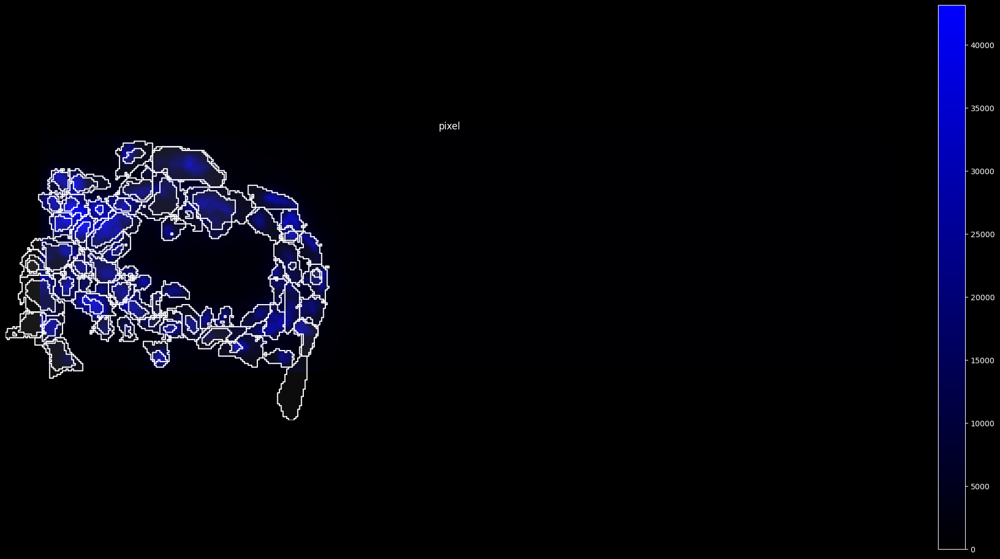

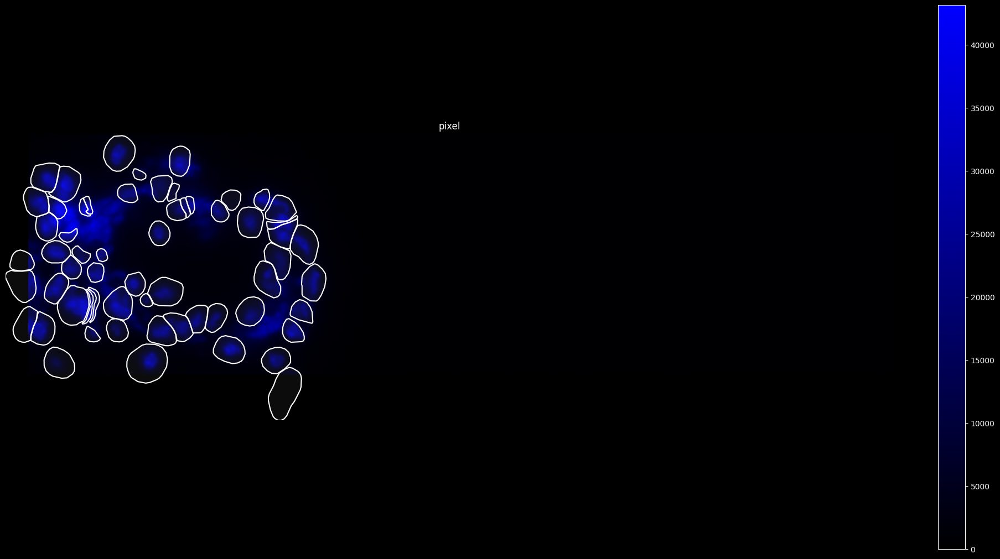

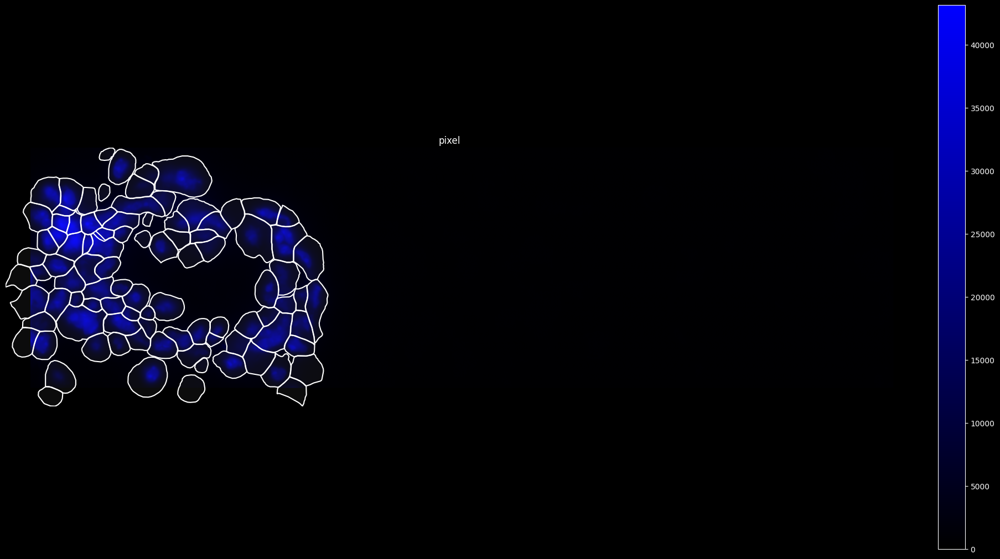

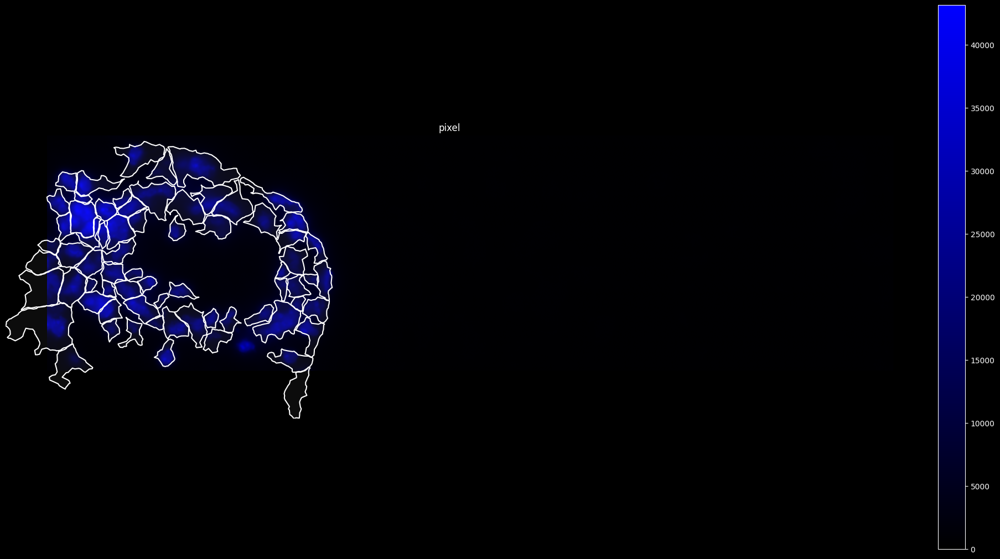

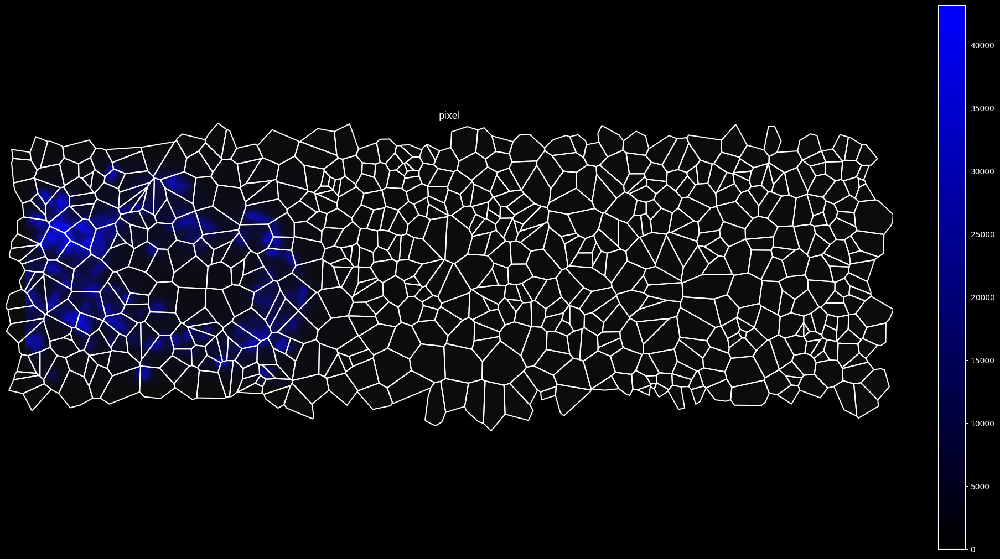

In [37]:
visualize_spatial_data(
    sdata_sub=sdata_sub,
    bounds=bounds,
    colors=colors,
    vname=vname,
    cell_types_mouse_brain=cell_types_mouse_brain,
    dotsize=dotsize,
    data_dir=data_dir,
    sample_name=sample_name,
    date_var=date_var,
)

In [67]:
# cap1
# pixel scale
vname = "capillaries1"
dotsize = 2.7
bb_xmin = 24200
bb_ymin = 31200
bb_w = 2500
bb_h = 1500
bb_xmax = bb_xmin + bb_w
bb_ymax = bb_ymin + bb_h

In [68]:
sdata_sub = sdata.query.bounding_box(
    axes=["x", "y"],
    min_coordinate=[bb_xmin, bb_ymin],
    max_coordinate=[bb_xmax, bb_ymax],
    target_coordinate_system="global",
)

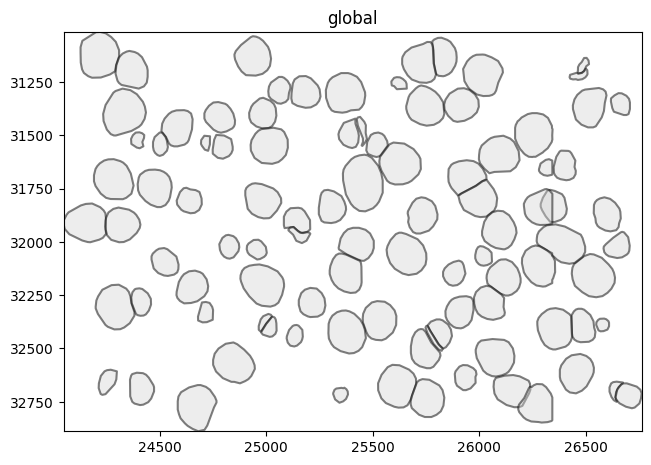

In [69]:
sdata_sub.pl.render_shapes(
    element=bounds[1],
    outline_alpha=0.5,
    fill_alpha=0.4,
).pl.show()

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Rasterizing image for faster rendering.                                                                   
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will b

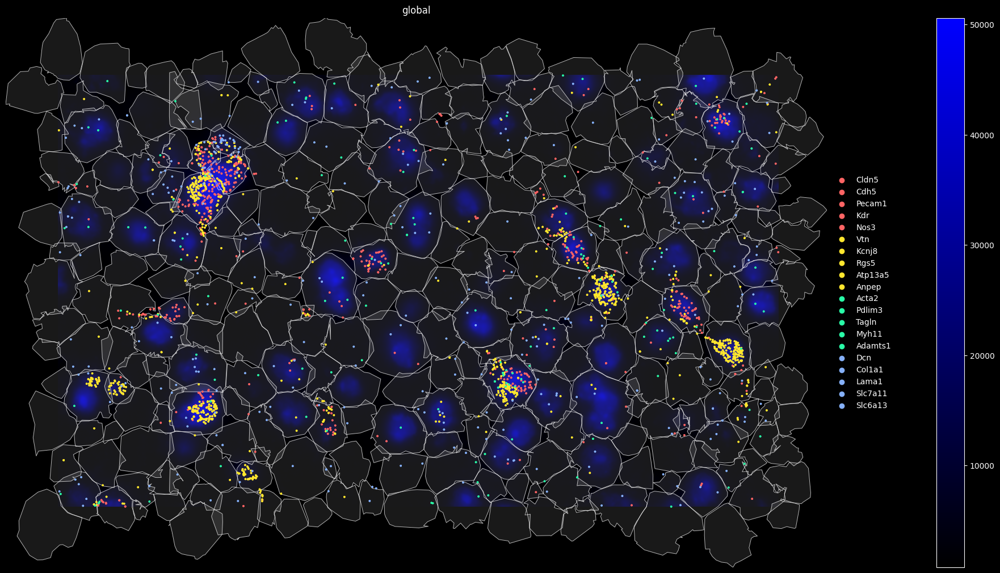

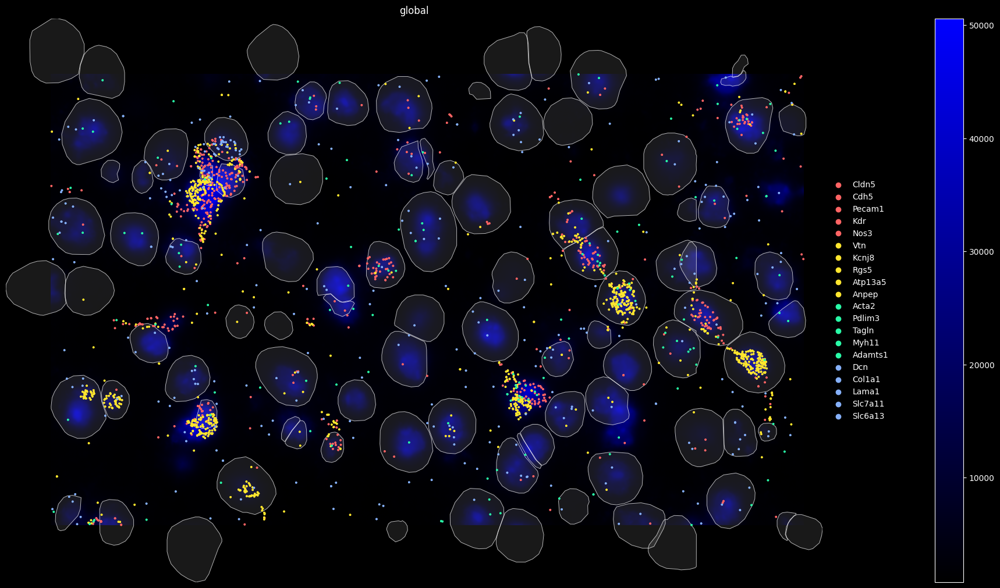

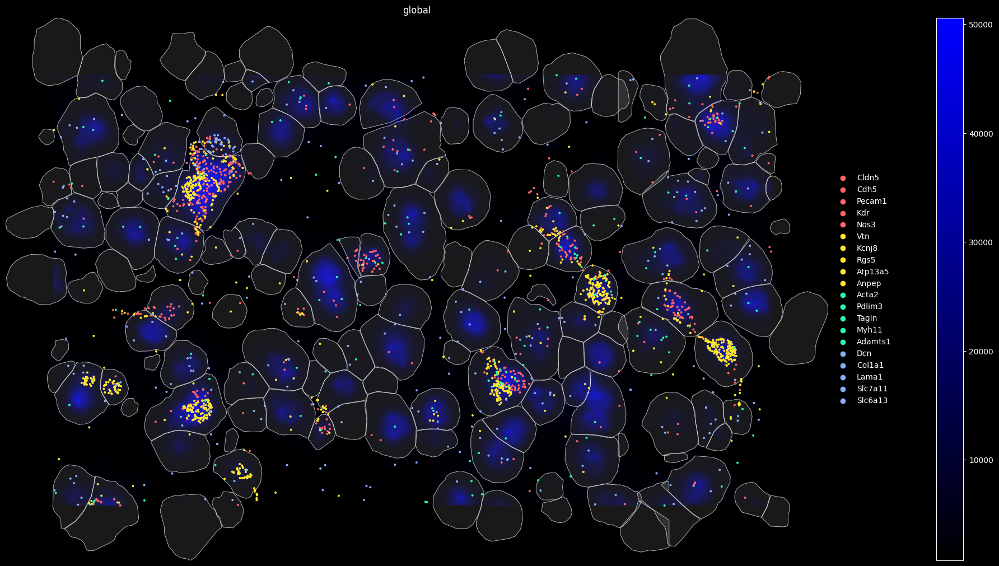

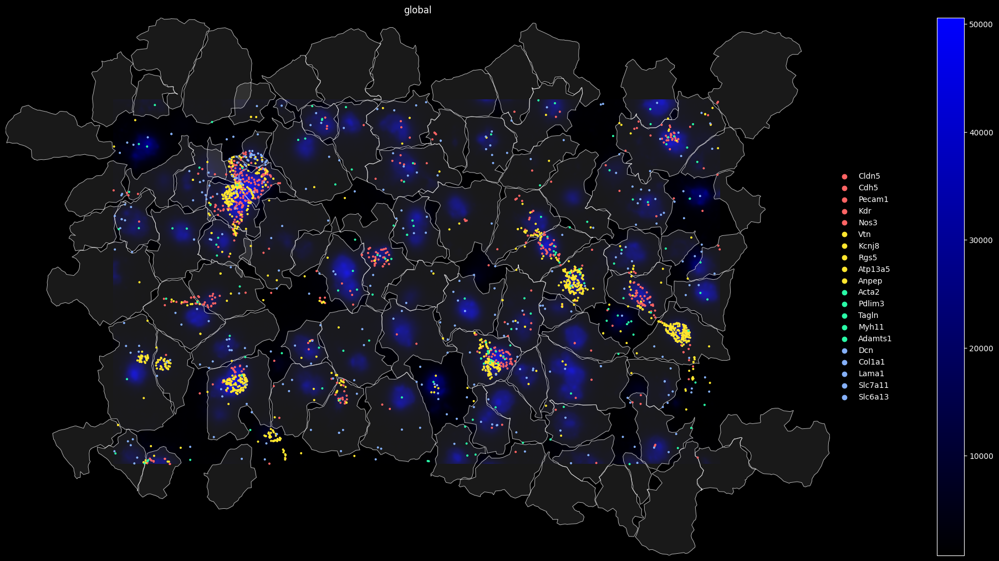

In [70]:
visualize_spatial_data(
    sdata_sub=sdata_sub,
    bounds=bounds,
    colors=colors,
    vname=vname,
    cell_types_mouse_brain=cell_types_mouse_brain,
    dotsize=dotsize,
    data_dir=data_dir,
    sample_name=sample_name,
    date_var=date_var,
)

In [47]:
# arteriole
# pixel scale
vname = "arteriole1"
dotsize = 0.8
bb_xmin = 55700
bb_ymin = 15300
bb_w = 6800
bb_h = 1250
bb_xmax = bb_xmin + bb_w
bb_ymax = bb_ymin + bb_h

In [17]:
sdata_sub = sdata.query.bounding_box(
    axes=["x", "y"],
    min_coordinate=[bb_xmin, bb_ymin],
    max_coordinate=[bb_xmax, bb_ymax],
    target_coordinate_system="global",
)

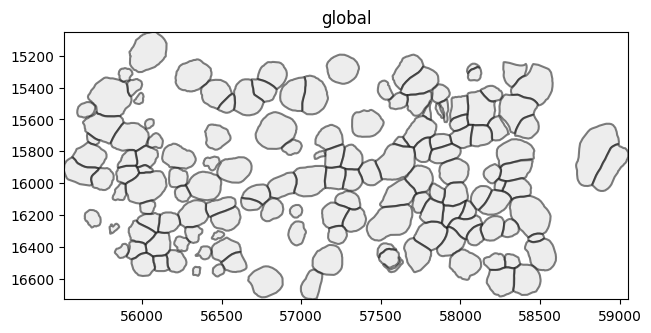

In [18]:
sdata_sub.pl.render_shapes(
    element=bounds[2],
    outline_alpha=0.5,
    fill_alpha=0.4,
).pl.show()

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Rasterizing image for faster rendering.                                                                   
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will b

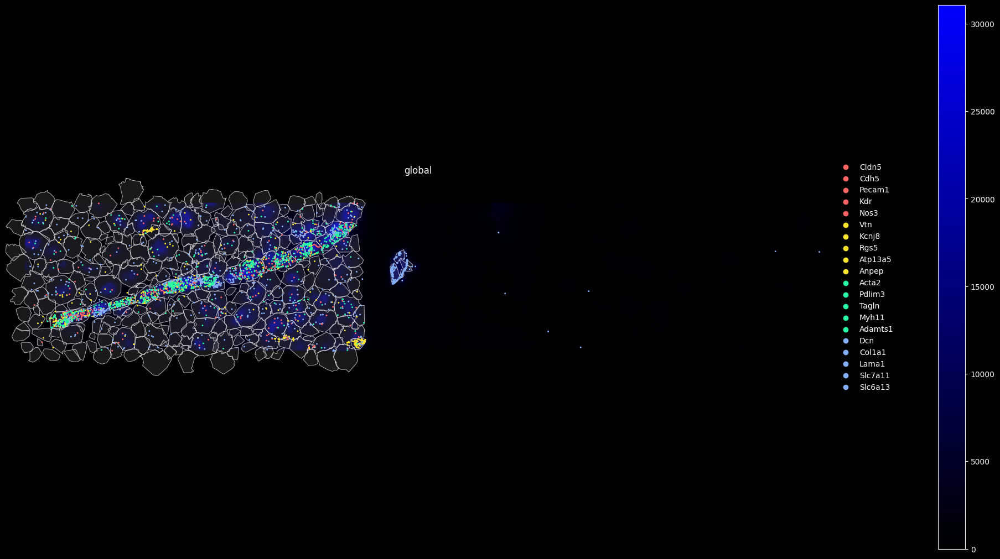

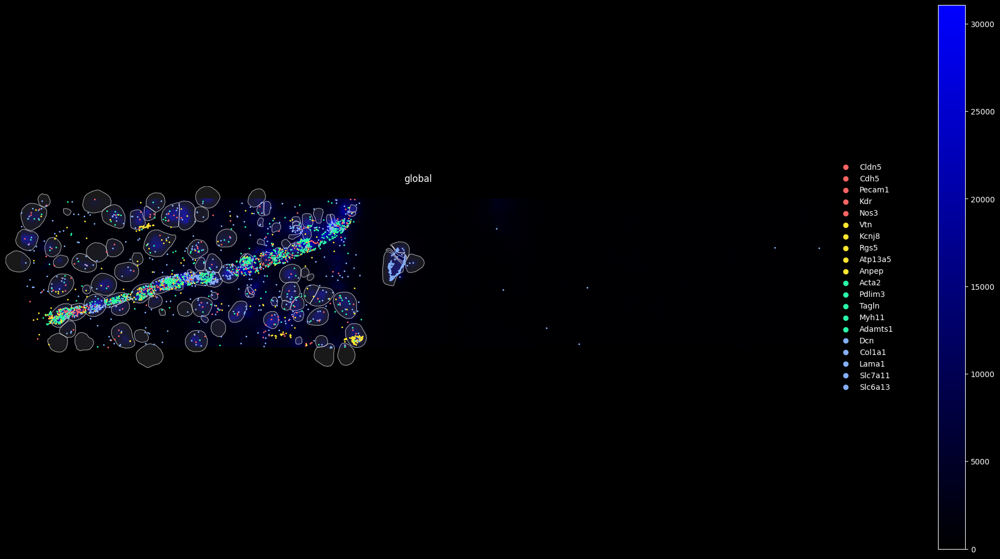

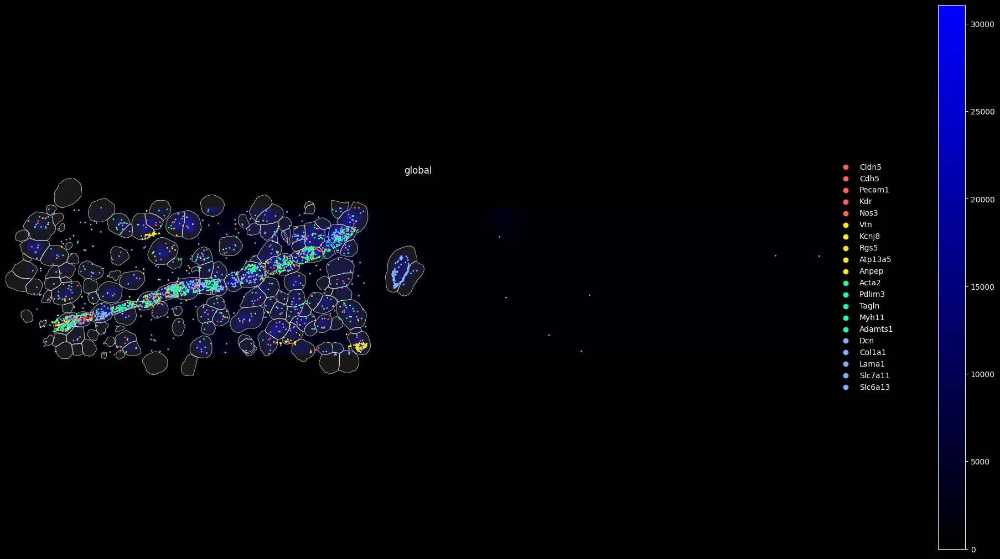

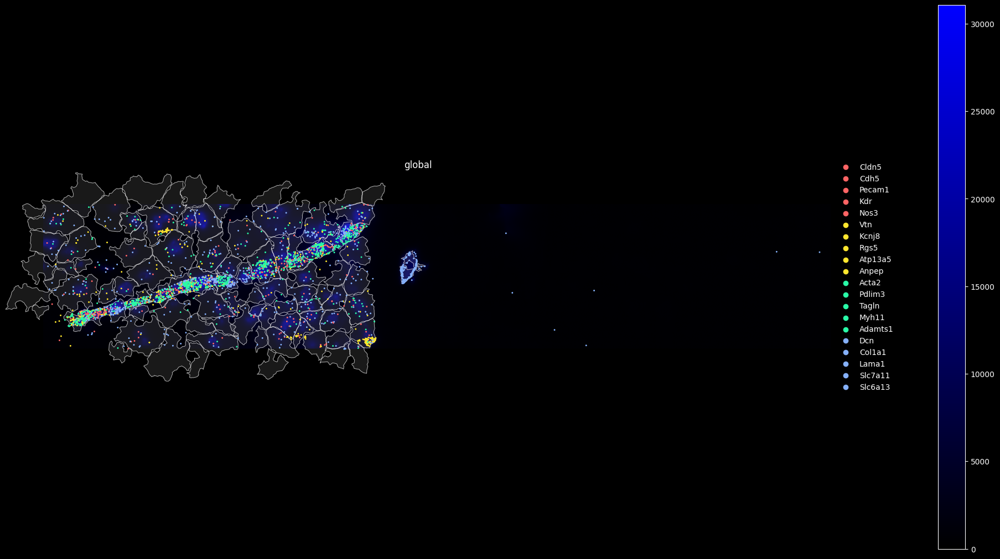

In [54]:
visualize_spatial_data(
    sdata_sub=sdata_sub,
    bounds=bounds,
    colors=colors,
    vname=vname,
    cell_types_mouse_brain=cell_types_mouse_brain,
    dotsize=dotsize,
    data_dir=data_dir,
    sample_name=sample_name,
    date_var=date_var,
)

In [80]:
# oligos
# pixel scale
vname = "oligos1"
dotsize = 0.8
bb_xmin = 26000
bb_ymin = 20800
bb_w = 2000
bb_h = 1400
bb_xmax = bb_xmin + bb_w
bb_ymax = bb_ymin + bb_h

In [81]:
sdata_sub = sdata.query.bounding_box(
    axes=["x", "y"],
    min_coordinate=[bb_xmin, bb_ymin],
    max_coordinate=[bb_xmax, bb_ymax],
    target_coordinate_system="global",
)

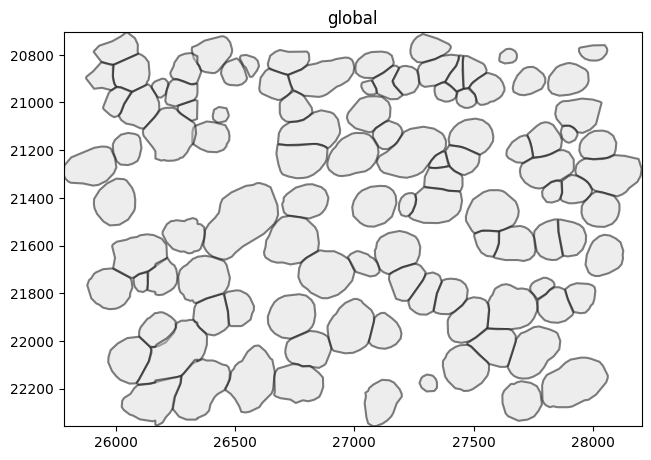

In [82]:
sdata_sub.pl.render_shapes(
    element=bounds[2],
    outline_alpha=0.5,
    fill_alpha=0.4,
).pl.show()

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Rasterizing image for faster rendering.                                                                   
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will b

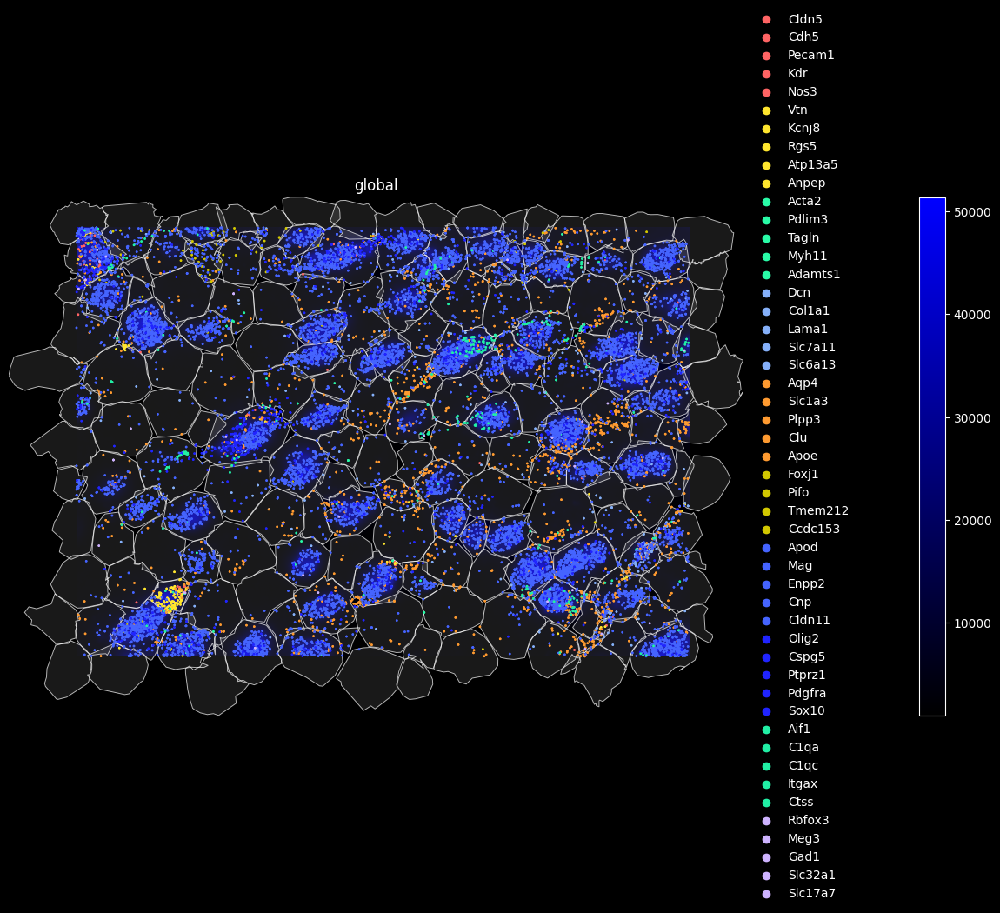

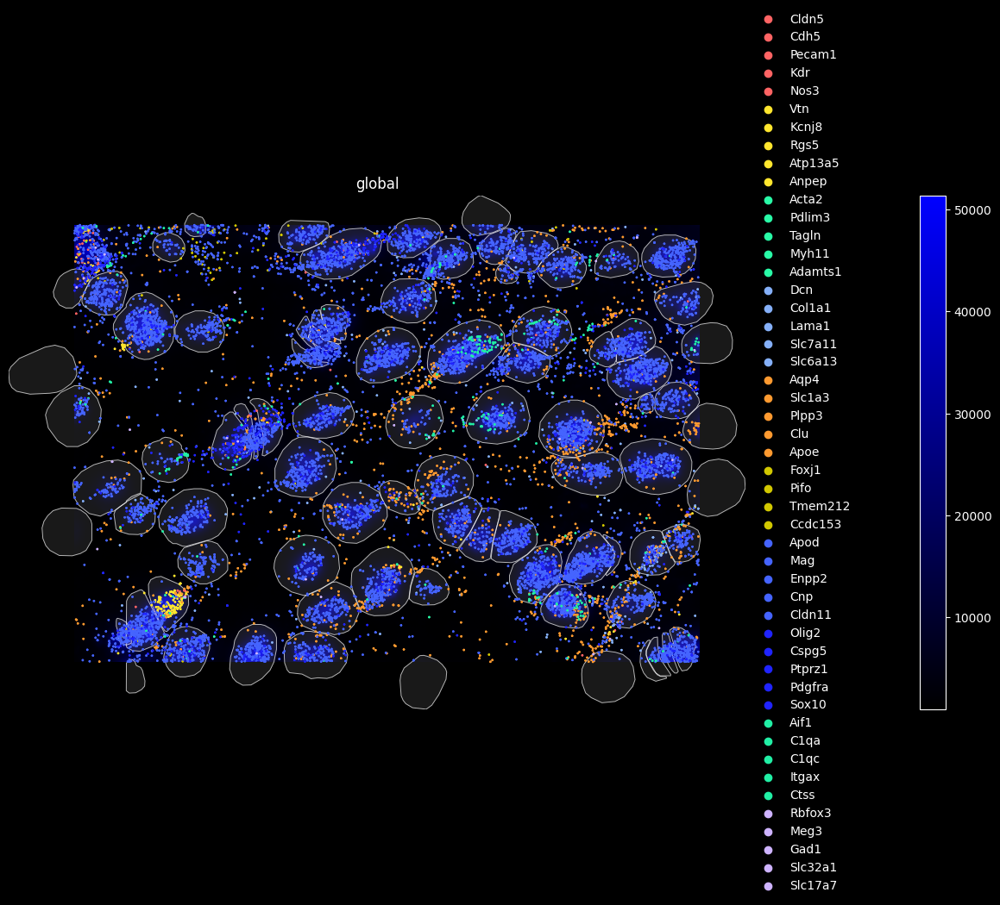

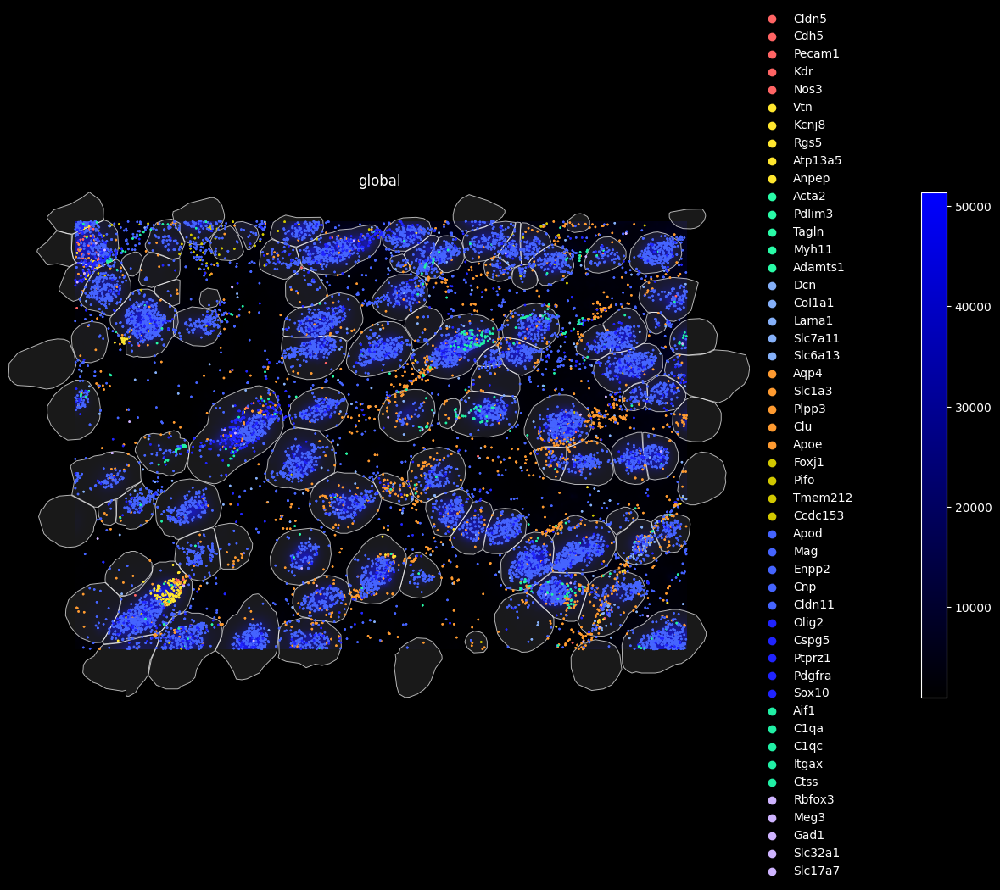

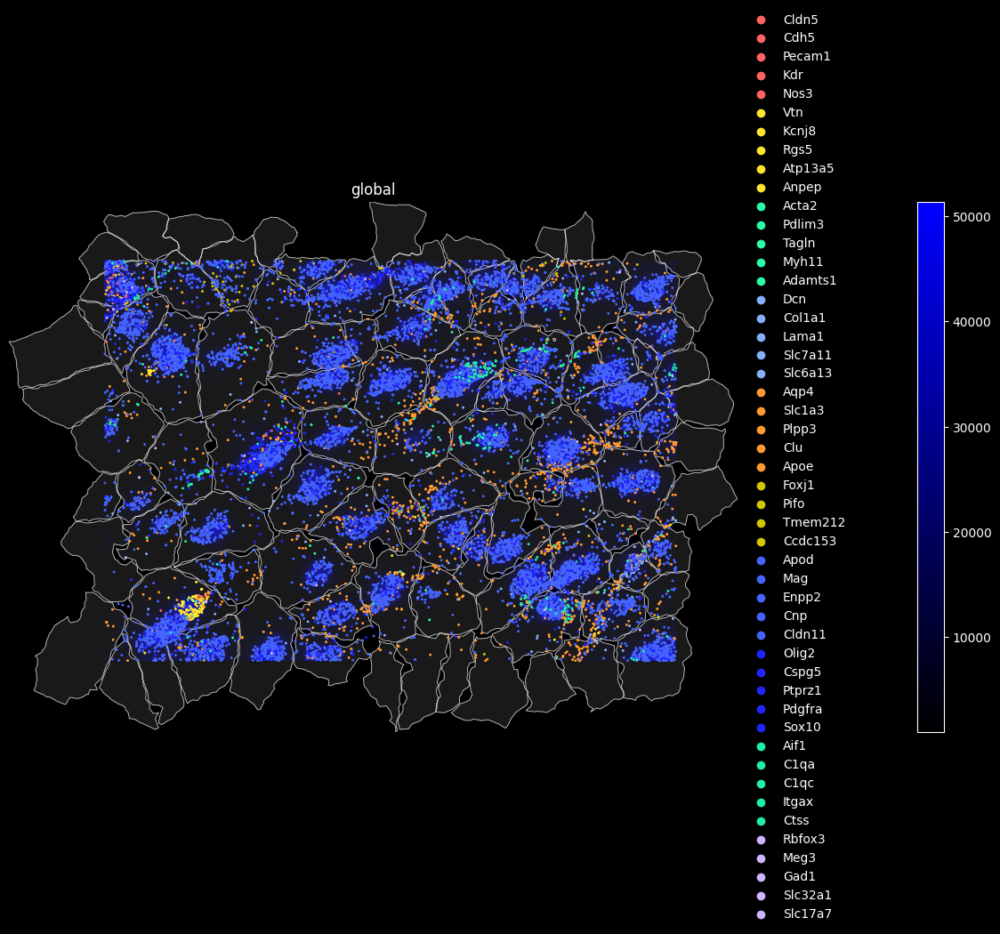

In [86]:
visualize_spatial_data(
    sdata_sub=sdata_sub,
    bounds=bounds,
    colors=colors_all,
    vname=vname,
    cell_types_mouse_brain=cell_types_mouse_brain_all,
    dotsize=dotsize,
    data_dir=data_dir,
    sample_name=sample_name,
    date_var=date_var,
)

In [120]:
# neurons
# pixel scale
vname = "neurons1"
dotsize = 0.2
bb_xmin = 30100
bb_ymin = 4500
bb_w = 2100
bb_h = 1500
bb_xmax = bb_xmin + bb_w
bb_ymax = bb_ymin + bb_h

In [113]:
sdata_sub = sdata.query.bounding_box(
    axes=["x", "y"],
    min_coordinate=[bb_xmin, bb_ymin],
    max_coordinate=[bb_xmax, bb_ymax],
    target_coordinate_system="global",
)

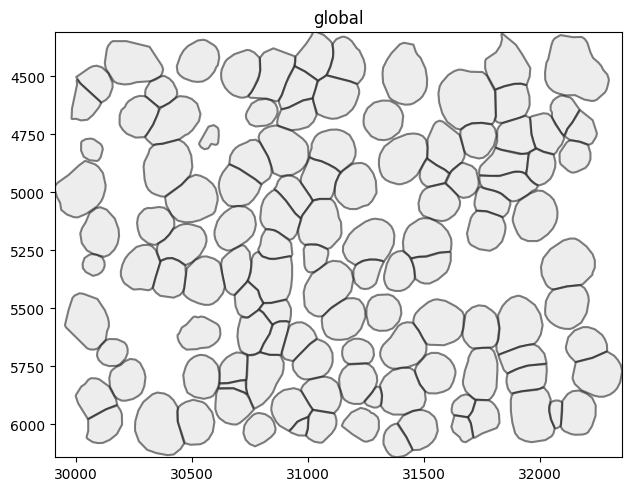

In [114]:
sdata_sub.pl.render_shapes(
    element=bounds[2],
    outline_alpha=0.5,
    fill_alpha=0.4,
).pl.show()

INFO     Value for parameter 'color' appears to be a color, using it as such.                                      
INFO     Rasterizing image for faster rendering.                                                                   
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will be used for all categories.                 
INFO     input has more than 103 categories. Uniform 'grey' color will b

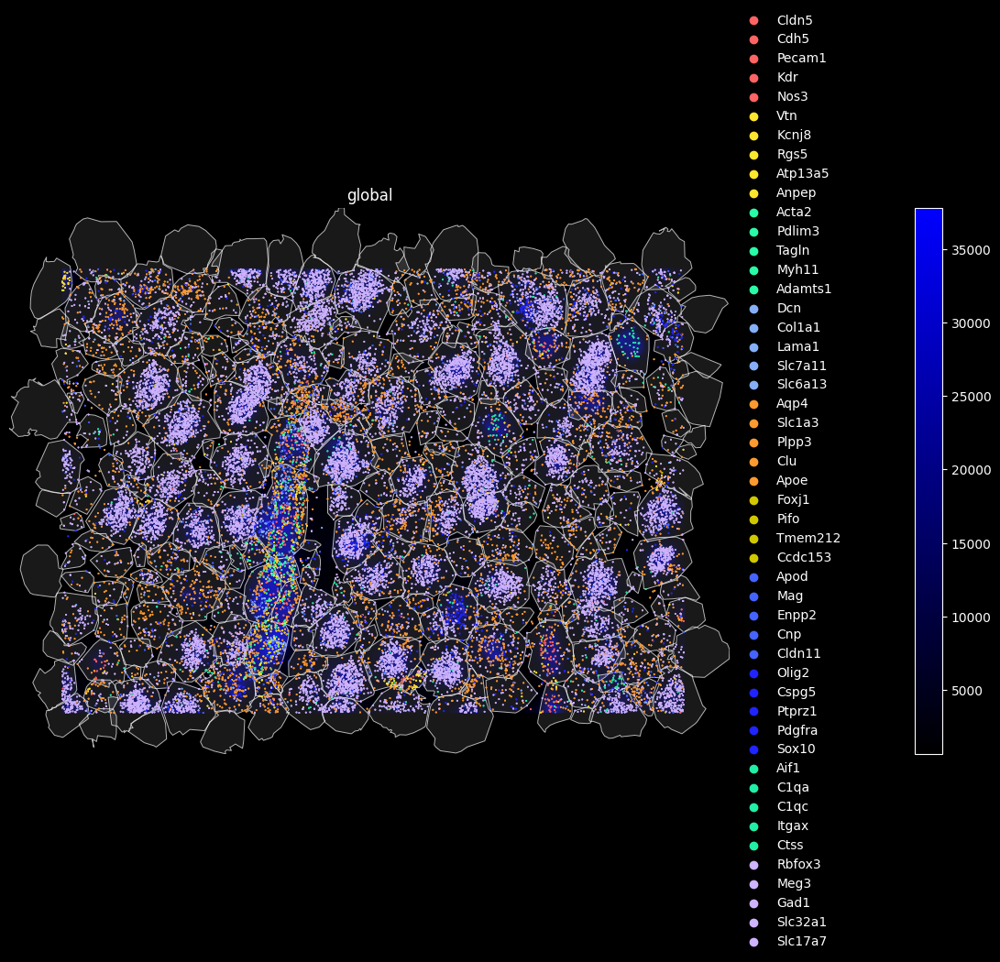

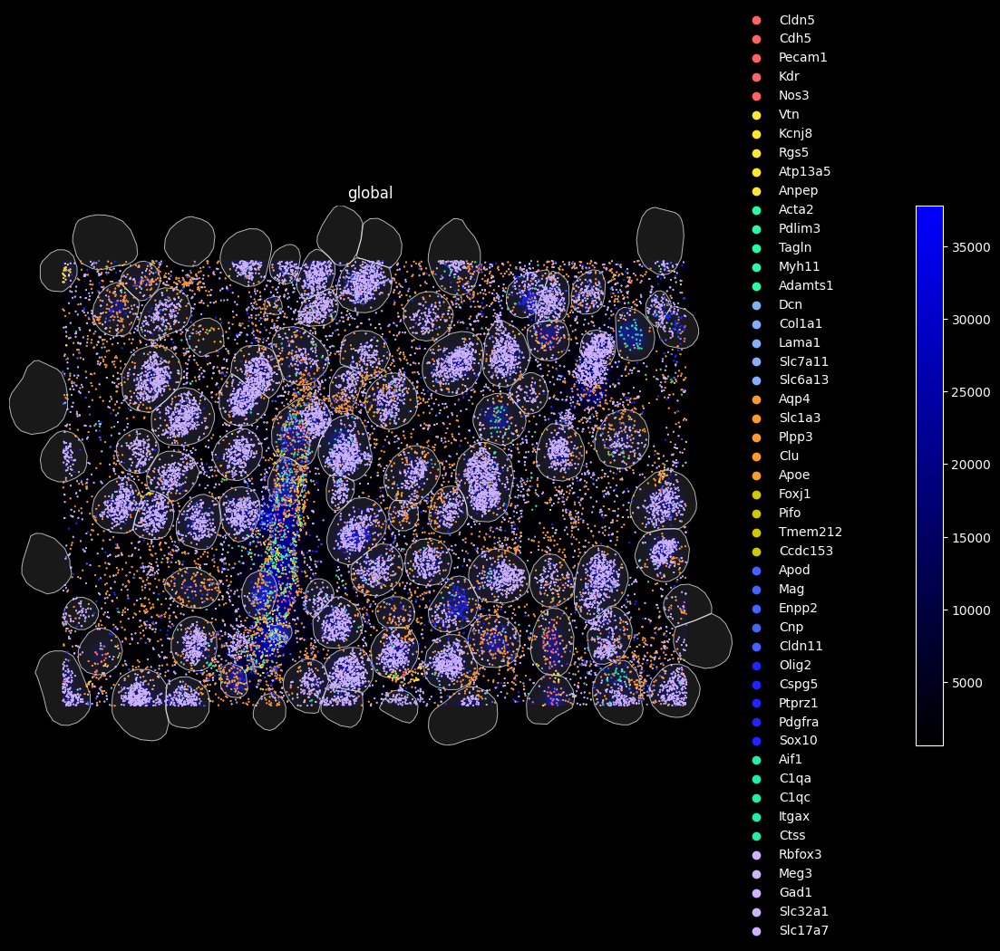

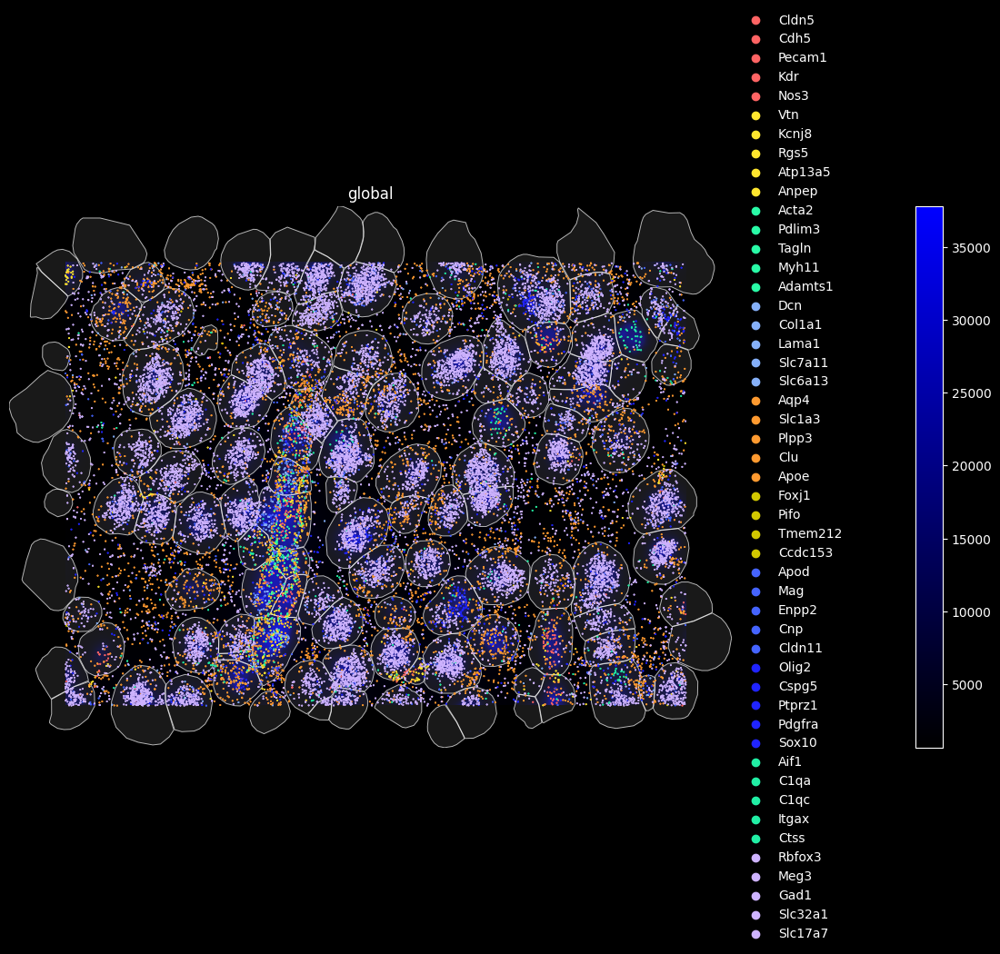

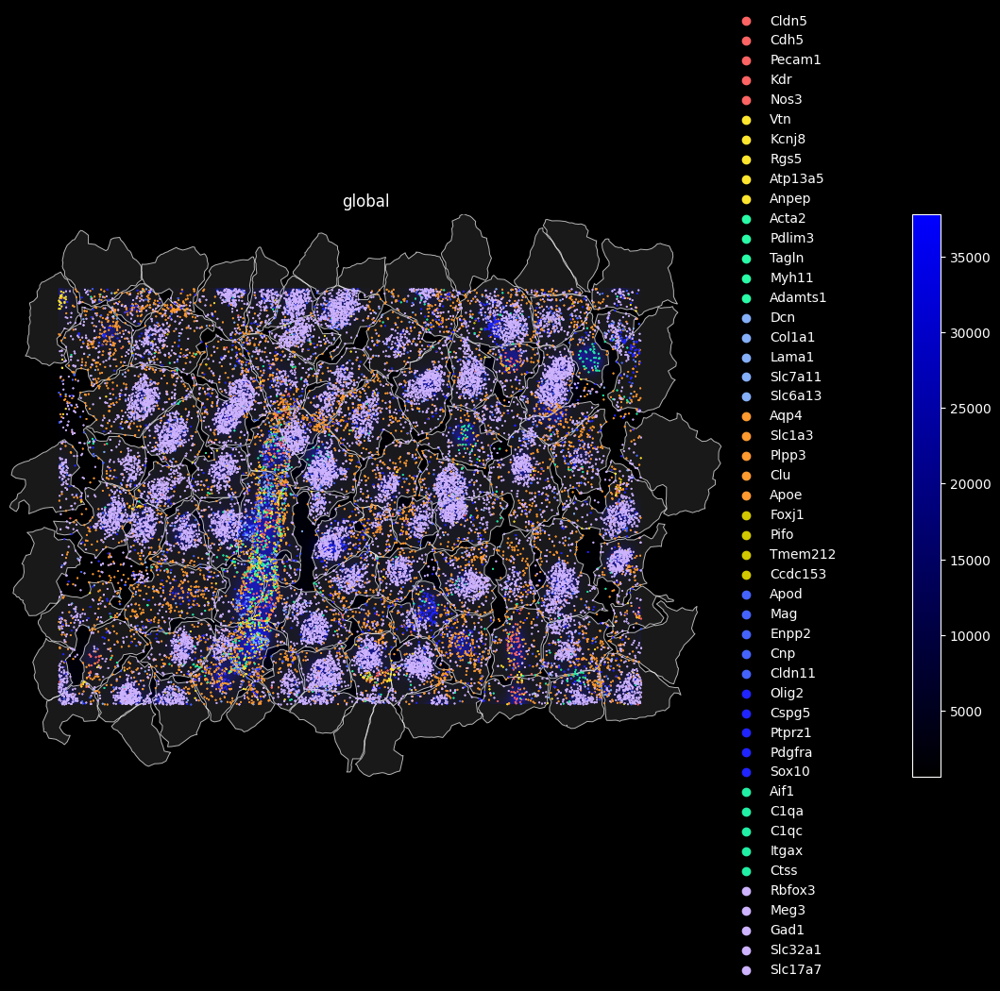

In [121]:
visualize_spatial_data(
    sdata_sub=sdata_sub,
    bounds=bounds,
    colors=colors_all,
    vname=vname,
    cell_types_mouse_brain=cell_types_mouse_brain_all,
    dotsize=dotsize,
    data_dir=data_dir,
    sample_name=sample_name,
    date_var=date_var,
)